In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# manipualtion
import pandas as pd
import numpy as np

# viz
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
# from folder.folder import file
from udf.preprocessing import *
from udf.visualization import *
# function from file
test_clean()
test_viz()

test clean
test viz


In [4]:
# # from folder.folder import file
# from udf.preprocessing import *
# from udf.visualization import *
# # function from file
# clean.test_clean()
# viz.test_viz()

In [5]:
test_clean()
clean.test_clean()
test_viz()
viz.test_viz()

test clean
test clean
test viz
test viz


In [6]:
# ?dl=1 for download csv file
filepath = "https://www.dropbox.com/s/zw8tsc51z7es3sd/water_pump_sensor_data.csv?dl=1"
df = pd.read_csv(filepath)

In [7]:
df.head()

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
1,1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2,2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
3,3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
4,4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [8]:
df.tail()

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
220315,220315,2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,...,38.28125,68.28703,52.37268,48.32176,41.087960,212.3843,153.6458,NaN,231.1921,NORMAL
220316,220316,2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,...,38.28125,66.84028,50.63657,48.03241,40.798610,213.8310,156.2500,NaN,231.1921,NORMAL
220317,220317,2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,...,39.06250,65.39352,48.90046,48.03241,40.798610,217.3032,155.3819,NaN,232.0602,NORMAL
220318,220318,2018-08-31 23:58:00,2.406366,47.69965,50.520832,43.142361,635.648100,65.09175,15.11863,16.56539,...,40.62500,64.23611,47.74306,48.32176,40.509258,222.5116,153.9352,NaN,234.0856,NORMAL
220319,220319,2018-08-31 23:59:00,2.396528,47.69965,50.520832,43.142361,639.814800,65.45634,15.11863,16.65220,...,41.40625,62.78935,46.29630,48.90046,40.219910,227.4306,150.4630,NaN,234.0856,NORMAL


In [9]:
df.columns

Index(['Unnamed: 0', 'timestamp', 'sensor_00', 'sensor_01', 'sensor_02',
       'sensor_03', 'sensor_04', 'sensor_05', 'sensor_06', 'sensor_07',
       'sensor_08', 'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12',
       'sensor_13', 'sensor_14', 'sensor_15', 'sensor_16', 'sensor_17',
       'sensor_18', 'sensor_19', 'sensor_20', 'sensor_21', 'sensor_22',
       'sensor_23', 'sensor_24', 'sensor_25', 'sensor_26', 'sensor_27',
       'sensor_28', 'sensor_29', 'sensor_30', 'sensor_31', 'sensor_32',
       'sensor_33', 'sensor_34', 'sensor_35', 'sensor_36', 'sensor_37',
       'sensor_38', 'sensor_39', 'sensor_40', 'sensor_41', 'sensor_42',
       'sensor_43', 'sensor_44', 'sensor_45', 'sensor_46', 'sensor_47',
       'sensor_48', 'sensor_49', 'sensor_50', 'sensor_51', 'machine_status'],
      dtype='object')

In [10]:
df = df.drop("Unnamed: 0", axis=1)

In [11]:
((df.isna().sum() / df.shape[0])*100).sort_values(ascending=False)

sensor_15         100.000000
sensor_50          34.956881
sensor_51           6.982117
sensor_00           4.633261
sensor_07           2.474129
sensor_08           2.317992
sensor_06           2.177741
sensor_09           2.085603
sensor_01           0.167484
sensor_30           0.118464
sensor_29           0.032680
sensor_32           0.030864
sensor_18           0.020879
sensor_17           0.020879
sensor_22           0.018609
sensor_25           0.016340
sensor_16           0.014070
sensor_49           0.012255
sensor_48           0.012255
sensor_47           0.012255
sensor_46           0.012255
sensor_45           0.012255
sensor_44           0.012255
sensor_43           0.012255
sensor_42           0.012255
sensor_41           0.012255
sensor_40           0.012255
sensor_39           0.012255
sensor_38           0.012255
sensor_14           0.009532
sensor_26           0.009078
sensor_03           0.008624
sensor_10           0.008624
sensor_13           0.008624
sensor_12     

In [12]:
df.shape

(220320, 54)

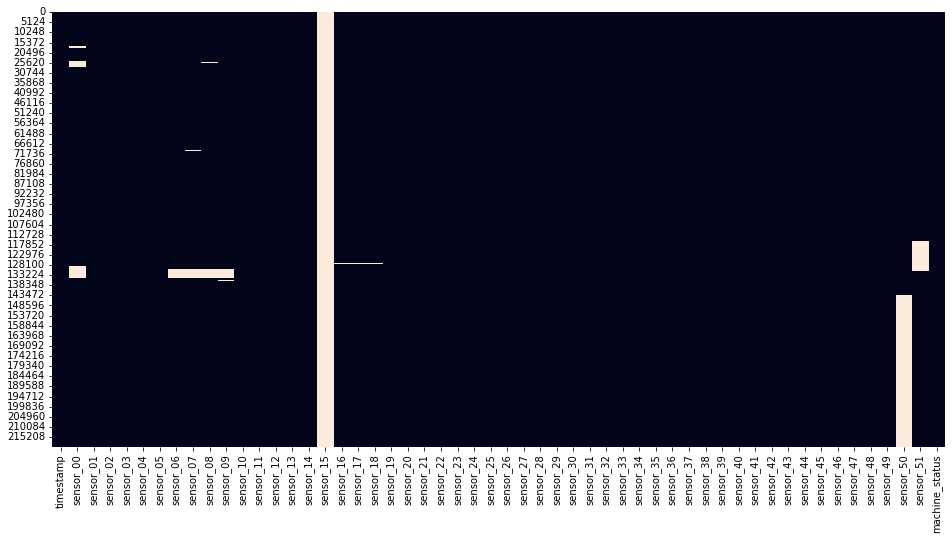

In [13]:
viz_na(df);

In [14]:
drop_columns = ["sensor_15","sensor_50"]
df = df.drop(drop_columns, axis=1)

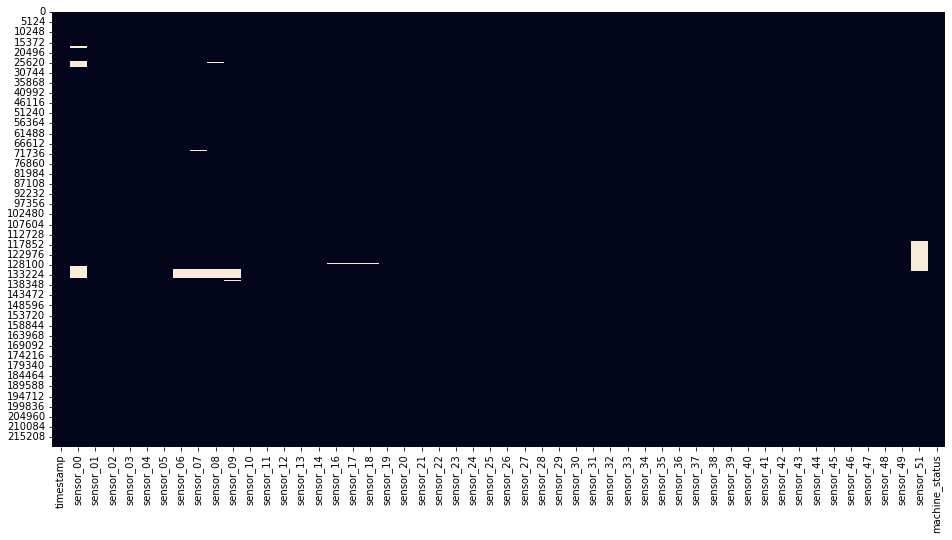

In [15]:
viz_na(df);

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220320 entries, 0 to 220319
Data columns (total 52 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   timestamp       220320 non-null  object 
 1   sensor_00       210112 non-null  float64
 2   sensor_01       219951 non-null  float64
 3   sensor_02       220301 non-null  float64
 4   sensor_03       220301 non-null  float64
 5   sensor_04       220301 non-null  float64
 6   sensor_05       220301 non-null  float64
 7   sensor_06       215522 non-null  float64
 8   sensor_07       214869 non-null  float64
 9   sensor_08       215213 non-null  float64
 10  sensor_09       215725 non-null  float64
 11  sensor_10       220301 non-null  float64
 12  sensor_11       220301 non-null  float64
 13  sensor_12       220301 non-null  float64
 14  sensor_13       220301 non-null  float64
 15  sensor_14       220299 non-null  float64
 16  sensor_16       220289 non-null  float64
 17  sensor_17 

In [17]:
df['machine_status'].value_counts()

NORMAL        205836
RECOVERING     14477
BROKEN             7
Name: machine_status, dtype: int64

In [18]:
df['machine_status'].value_counts(normalize=True)

NORMAL        0.934259
RECOVERING    0.065709
BROKEN        0.000032
Name: machine_status, dtype: float64

In [19]:
df["timestamp"] = pd.to_datetime(df['timestamp'], format="%Y-%m-%d %H:%M:%S")

In [20]:
# def viz_sensor(data, sensor="00"):
#     fig = plt.plot(data['timestamp'], data[f"sensor_{sensor}"])
#     return fig

In [21]:
# viz_sensor(df,sensor="00")

In [22]:
# def viz_sensor(data, sensor="00"):
#     sensor_name = f"sensor_{sensor}"
#     fig = go.Figure()

#     fig.add_trace(go.Scatter(
#         x=data.loc[:,'timestamp'],
#         y=data.loc[:,sensor_name],
#         mode="lines",
#         name=sensor_name,
#         line=dict(color="royalblue")
#     ))
#     fig.update_layout(title=sensor_name)
#     return fig

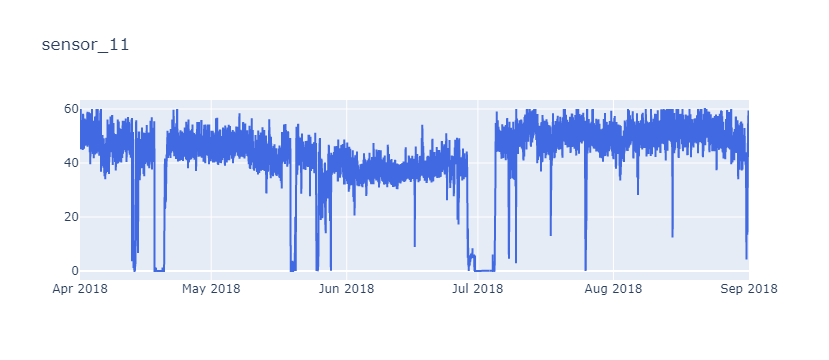

In [24]:
viz_sensor(df, sensor="11")

In [35]:
df['timestamp'].min(), df['timestamp'].max()

(Timestamp('2018-04-01 00:00:00'), Timestamp('2018-08-31 23:59:00'))

In [31]:
SENSORS = df.columns[df.columns.str.contains("sensor_")]

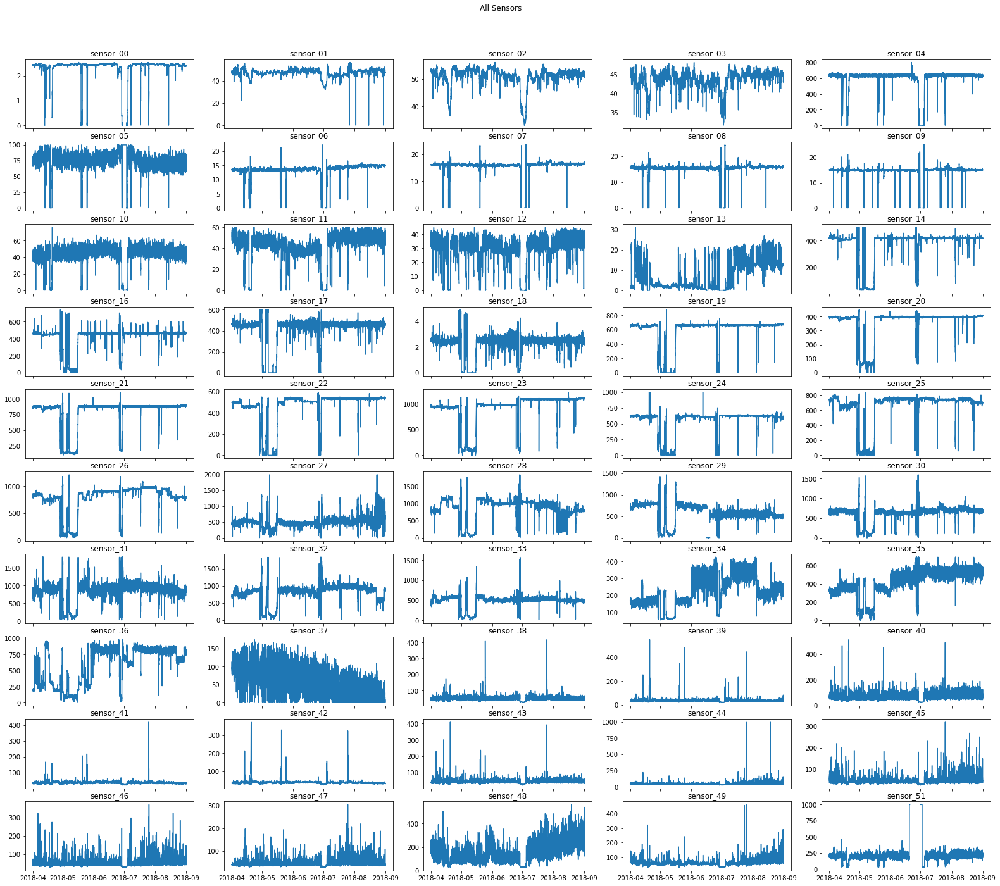

In [33]:
fig, axes = plt.subplots(nrows=10,ncols=5, sharex=True, sharey=False, figsize=(22, 20))

axes = axes.ravel()

fig.tight_layout(rect=[0,0.03,1,0.95])
fig.suptitle(f"All Sensors", y=1)

for idx, sensor in enumerate(SENSORS):
    axes[idx].plot(df['timestamp'],df[sensor])
    axes[idx].title.set_text(f"{sensor}")